# Spatial clustering and denoising expressions

Spatial clustering, which shares an analogy with single-cell clustering, has expanded the scope of tissue physiology studies from cell-centroid to structure-centroid with spatially resolved transcriptomics (SRT) data.

Here, we presented four spatial clustering methods in OmicVerse.

We made three improvements in integrating the `GraphST`,`BINARY`,`CAST` and `STAGATE` algorithm in OmicVerse:
- We removed the preprocessing that comes with `GraphST` and used the preprocessing consistent with all SRTs in OmicVerse
- We optimised the dimensional display of `GraphST`, and PCA is considered a self-contained computational step.
- We implemented `mclust` using Python, removing the R language dependency.
- We provided a unified interface `ov.space.cluster`, the user can use the function interface at once to complete all the simultaneous

If you found this tutorial helpful, please cite `GraphST`,`BINARY`,`CAST` and `STAGATE` and `OmicVerse`:

- Long, Y., Ang, K.S., Li, M. et al. Spatially informed clustering, integration, and deconvolution of spatial transcriptomics with GraphST. Nat Commun 14, 1155 (2023). https://doi.org/10.1038/s41467-023-36796-3
- Lin S, Cui Y, Zhao F, Yang Z, Song J, Yao J, et al. Complete spatially resolved gene expression is not necessary for identifying spatial domains. Cell Genomics. 2024;4:100565.
- Tang, Z., Luo, S., Zeng, H. et al. Search and match across spatial omics samples at single-cell resolution. Nat Methods 21, 1818–1829 (2024). https://doi.org/10.1038/s41592-024-02410-7
- Dong, K., Zhang, S. Deciphering spatial domains from spatially resolved transcriptomics with an adaptive graph attention auto-encoder. Nat Commun 13, 1739 (2022). https://doi.org/10.1038/s41467-022-29439-6



In [2]:
import omicverse as ov
#print(f"omicverse version: {ov.__version__}")
import scanpy as sc
#print(f"scanpy version: {sc.__version__}")
ov.plot_set(font_path='Arial')
!date

🔬 Starting plot initialization...
Using already downloaded Arial font from: /tmp/omicverse_arial.ttf
Registered as: Arial
🧬 Detecting CUDA devices…
✅ [GPU 0] NVIDIA GeForce RTX 2080 Ti
    • Total memory: 10.7 GB
    • Compute capability: 7.5
✅ [GPU 1] NVIDIA GeForce RTX 2080 Ti
    • Total memory: 10.7 GB
    • Compute capability: 7.5

   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

🔖 Version: 1.7.6rc1   📚 Tutorials: https://omicverse.readthedocs.io/
✅ plot_set complete.

2025年 08月 05日 星期二 09:58:33 CST


## Preprocess data

Here we present our re-analysis of 151676 sample of the dorsolateral prefrontal cortex (DLPFC) dataset. Maynard et al. has manually annotated DLPFC layers and white matter (WM) based on the morphological features and gene markers.

This tutorial demonstrates how to identify spatial domains on 10x Visium data using STAGATE. The processed data are available at https://github.com/LieberInstitute/spatialLIBD. We downloaded the manual annotation from the spatialLIBD package and provided at https://drive.google.com/drive/folders/10lhz5VY7YfvHrtV40MwaqLmWz56U9eBP?usp=sharing.

In [3]:
adata = sc.read_visium(path='data', count_file='151676_filtered_feature_bc_matrix.h5')
adata.var_names_make_unique()

reading data/151676_filtered_feature_bc_matrix.h5


 (0:00:00)


<div class="admonition warning">
  <p class="admonition-title">Note</p>
  <p>
    We introduced the spatial special svg calculation module prost in omicverse versions greater than `1.6.0` to replace scanpy's HVGs, if you want to use scanpy's HVGs you can set mode=`scanpy` in `ov.space.svg` or use the following code.
  </p>
</div>

```python
#adata=ov.pp.preprocess(adata,mode='shiftlog|pearson',n_HVGs=3000,target_sum=1e4)
#adata.raw = adata
#adata = adata[:, adata.var.highly_variable_features]
```

In [4]:
sc.pp.calculate_qc_metrics(adata, inplace=True)
adata = adata[:,adata.var['total_counts']>100]
adata=ov.space.svg(adata,mode='prost',n_svgs=3000,target_sum=1e4,platform="visium",)
adata


Filtering genes ...

Calculating image index 1D:

Normalize each geneing...

Gaussian filtering...


100%|██████████| 5779/5779 [00:22<00:00, 255.88it/s]



Binary segmentation for each gene:


100%|██████████| 5779/5779 [00:22<00:00, 261.35it/s]



Spliting subregions for each gene:


100%|██████████| 5779/5779 [00:23<00:00, 249.65it/s]



Computing PROST Index for each gene:


100%|██████████| 5779/5779 [00:05<00:00, 1051.34it/s]


PROST Index calculation completed !!
PI calculation is done!
normalizing counts per cell
    finished (0:00:00)


normalization and log1p are done!


AnnData object with n_obs × n_vars = 3460 × 5779
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'image_idx_1d'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'SEP', 'SIG', 'PI', 'space_variable_features', 'highly_variable'
    uns: 'spatial', 'grid_size', 'locates', 'nor_counts', 'gau_fea', 'binary_image', 'subregions', 'del_index', 'log1p', 'REFERENCE_MANU'
    obsm: 'spatial'
    layers: 'counts'

In [5]:
adata.write('data/cluster_svg.h5ad',compression='gzip')

In [6]:
adata=ov.read('data/cluster_svg.h5ad',compression='gzip')

(Optional) We read the ground truth area of our spatial data

This step is not mandatory to run, in the tutorial, it's just to demonstrate the accuracy of our clustering effect, and in your own tasks, there is often no Ground_truth

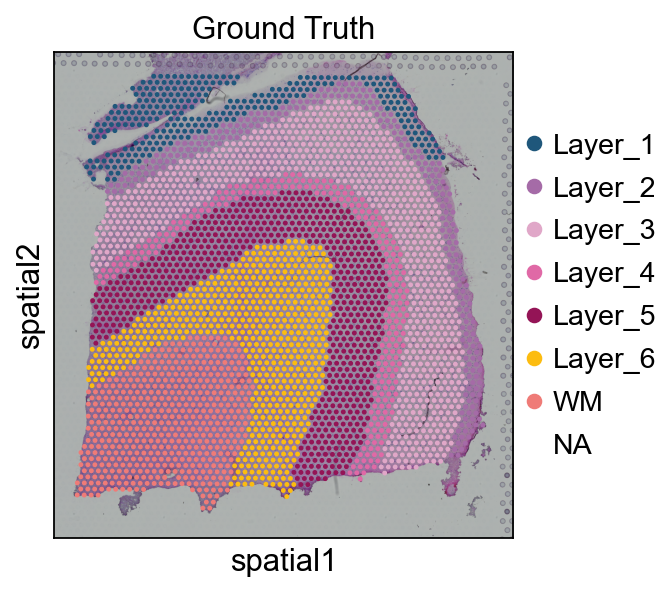

In [7]:
# read the annotation
import pandas as pd
import os
Ann_df = pd.read_csv(os.path.join('data', '151676_truth.txt'), sep='\t', header=None, index_col=0)
Ann_df.columns = ['Ground Truth']
adata.obs['Ground Truth'] = Ann_df.loc[adata.obs_names, 'Ground Truth']
sc.pl.spatial(adata, img_key="hires", color=["Ground Truth"])

## Method1: GraphST

GraphST was rated as one of the best spatial clustering algorithms on Nature Method 2024.04, so we first tried to call GraphST for spatial domain identification in OmicVerse.

In [8]:
methods_kwargs={}
methods_kwargs['GraphST']={
    'device':'cuda:0',
    'n_pcs':30
}

adata=ov.space.clusters(adata,
                  methods=['GraphST'],
                  methods_kwargs=methods_kwargs,
                  lognorm=1e4)

The GraphST method is used to embed the spatial data.


Begin to train ST data...


100%|██████████| 600/600 [00:14<00:00, 42.51it/s]


Optimization finished for ST data!
computing PCA
    with n_comps=30
    finished (0:00:00)
GraphST embedding has been saved in adata.obsm["GraphST_embedding"]                         and adata.obsm["graphst|original|X_pca"]
The GraphST embedding are stored in adata.obsm["GraphST_embedding"]. 
Shape: (3460, 3000)


In [9]:
ov.utils.cluster(adata,use_rep='graphst|original|X_pca',method='mclust',n_components=10,
                 modelNames='EEV', random_state=112,
                )
adata.obs['mclust_GraphST'] = ov.utils.refine_label(adata, radius=50, key='mclust') 
adata.obs['mclust_GraphST']=adata.obs['mclust_GraphST'].astype('category')

running GaussianMixture clustering
finished: found 10 clusters and added
    'mclust', the cluster labels (adata.obs, categorical)


 54%|█████▍    | 1878/3460 [00:00<00:00, 3089.07it/s]

100%|██████████| 3460/3460 [00:01<00:00, 3048.47it/s]


Storing dendrogram info using `.uns['dendrogram_mclust_GraphST']`
The merged cluster information is stored in adata.obs["mclust_GraphST_tree"].


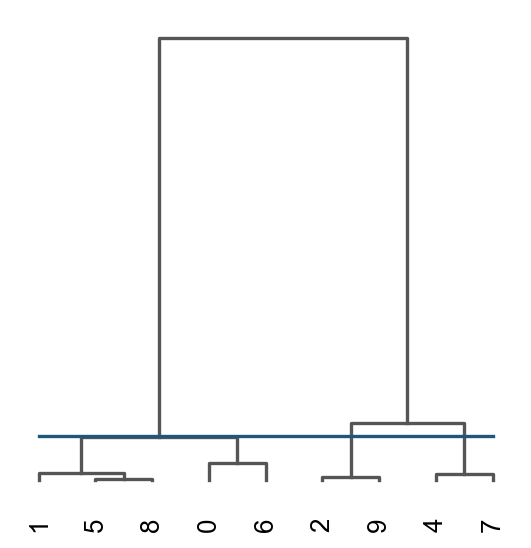

In [10]:
res=ov.space.merge_cluster(adata,groupby='mclust_GraphST',use_rep='graphst|original|X_pca',
                  threshold=0.2,plot=True)

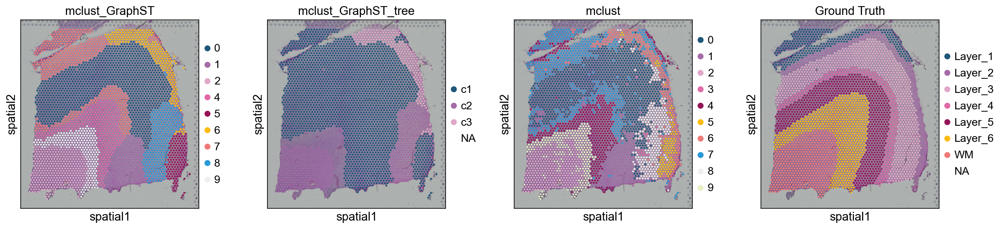

In [11]:
sc.pl.spatial(adata, color=['mclust_GraphST','mclust_GraphST_tree','mclust','Ground Truth'])

We can also use `mclust_R` to cluster the spatial domain, but this method need to install `rpy2` at first.

The use of the mclust algorithm requires the rpy2 package and the mclust package. See https://pypi.org/project/rpy2/ and https://cran.r-project.org/web/packages/mclust/index.html for detail.

R callback write-console:                    __           __ 
   ____ ___  _____/ /_  _______/ /_
  / __ `__ \/ ___/ / / / / ___/ __/
 / / / / / / /__/ / /_/ (__  ) /_  
/_/ /_/ /_/\___/_/\__,_/____/\__/   version 6.1.1
Type 'citation("mclust")' for citing this R package in publications.
  


fitting ...
  |                                                                      |   0%

  |======================================================================| 100%
finished: found 10 clusters and added
    'mclust', the cluster labels (adata.obs, categorical)


100%|██████████| 3460/3460 [00:00<00:00, 3815.31it/s]

Storing dendrogram info using `.uns['dendrogram_mclust_R_GraphST']`


The merged cluster information is stored in adata.obs["mclust_R_GraphST_tree"].


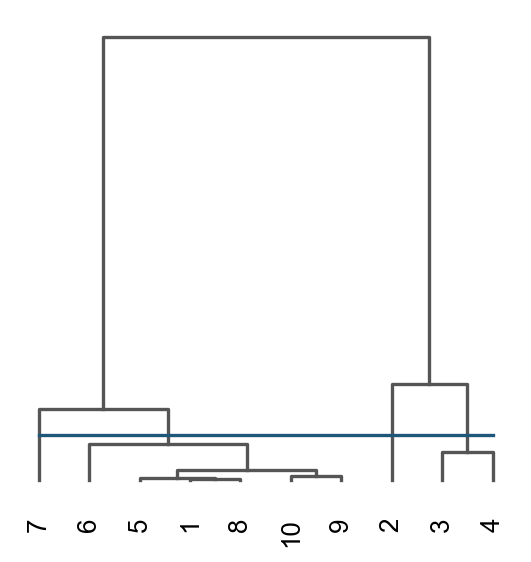

In [12]:
ov.utils.cluster(adata,use_rep='graphst|original|X_pca',method='mclust_R',n_components=10,
                 random_state=42,
                )
adata.obs['mclust_R_GraphST'] = ov.utils.refine_label(adata, radius=30, key='mclust_R') 
adata.obs['mclust_R_GraphST']=adata.obs['mclust_R_GraphST'].astype('category')
res=ov.space.merge_cluster(adata,groupby='mclust_R_GraphST',use_rep='graphst|original|X_pca',
                  threshold=0.2,plot=True)

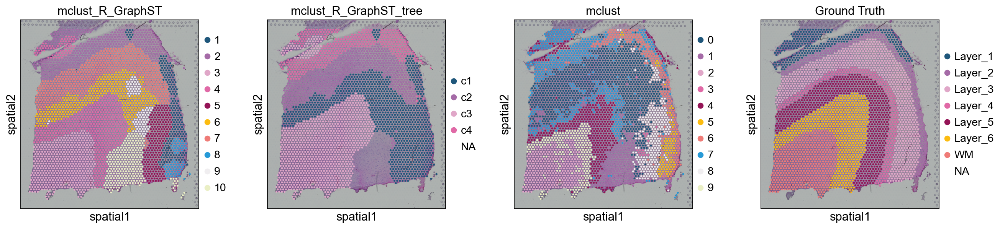

In [13]:
sc.pl.spatial(adata, color=['mclust_R_GraphST','mclust_R_GraphST_tree','mclust','Ground Truth'])

## Method2: BINARY

BINARY outperforms existing methods across various SRT data types while using significantly less input information.

If your data is very large, or very sparse, I believe BINARY would be a great choice.

In [14]:
methods_kwargs={}
methods_kwargs['BINARY']={
    'use_method':'KNN',
    'cutoff':6,
    'obs_key':'BINARY_sample',
    'use_list':None,
    'pos_weight':10,
    'device':'cuda:0',
    'hidden_dims':[512, 30],
    'n_epochs': 1000,
    'lr':  0.001,
    'key_added': 'BINARY',
    'gradient_clipping': 5,
    'weight_decay': 0.0001,
    'verbose': True,
    'random_seed':0,
    'lognorm':1e4,
    'n_top_genes':2000,
}
adata=ov.space.clusters(adata,methods=['BINARY'],methods_kwargs=methods_kwargs)

The BINARY method is used to embed the spatial data.
Recover the counts matrix from log-normalized data.


 55%|█████▍    | 1888/3460 [00:01<00:00, 1572.27it/s]

100%|██████████| 3460/3460 [00:02<00:00, 1545.78it/s]


extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
------Constructing spatial graph...------
The graph contains 20760 edges, 3460 cells.
6.0000 neighbors per cell on average.
Size of Input:  (3460, 2000)


100%|██████████| 1000/1000 [00:14<00:00, 67.79it/s]


The binary embedding are stored in adata.obsm["BINARY"]. 
Shape: (3460, 30)


if you want to use R's `mclust`, you can use `ov.utils.cluster`.

But you need to install `rpy2` and `mclust` at first.

In [15]:
ov.utils.cluster(adata,use_rep='BINARY',method='mclust_R',n_components=10,
                 random_state=42,
                )
adata.obs['mclust_BINARY'] = ov.utils.refine_label(adata, radius=30, key='mclust_R') 
adata.obs['mclust_BINARY']=adata.obs['mclust_BINARY'].astype('category')

fitting ...
  |======================================================================| 100%
finished: found 10 clusters and added
    'mclust', the cluster labels (adata.obs, categorical)


100%|██████████| 3460/3460 [00:00<00:00, 3863.65it/s]


Storing dendrogram info using `.uns['dendrogram_mclust_BINARY']`


The merged cluster information is stored in adata.obs["mclust_BINARY_tree"].


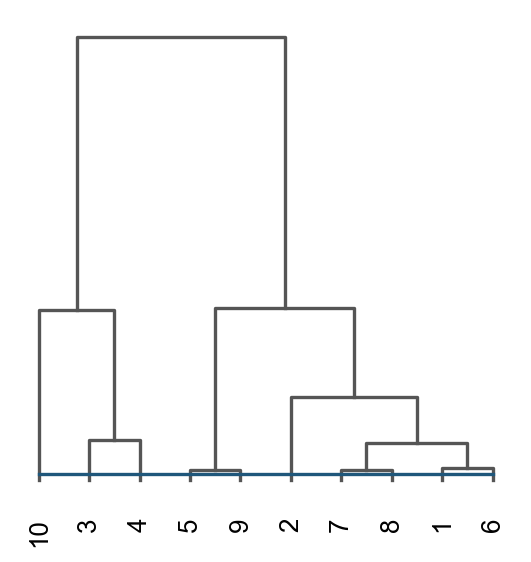

In [16]:
res=ov.space.merge_cluster(adata,groupby='mclust_BINARY',use_rep='BINARY',
                  threshold=0.01,plot=True)

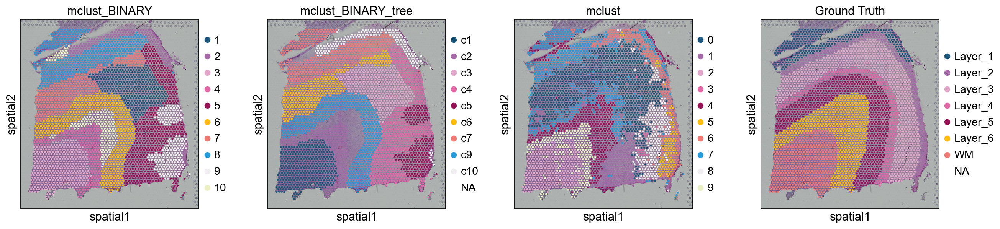

In [17]:
sc.pl.spatial(adata, color=['mclust_BINARY','mclust_BINARY_tree','mclust','Ground Truth'])

In [18]:
ov.utils.cluster(adata,use_rep='BINARY',method='mclust',n_components=10,
                 modelNames='EEV', random_state=42,
                )
adata.obs['mclustpy_BINARY'] = ov.utils.refine_label(adata, radius=30, key='mclust') 
adata.obs['mclustpy_BINARY']=adata.obs['mclustpy_BINARY'].astype('category')

running GaussianMixture clustering
finished: found 10 clusters and added
    'mclust', the cluster labels (adata.obs, categorical)


 57%|█████▋    | 1967/3460 [00:00<00:00, 3667.75it/s]

100%|██████████| 3460/3460 [00:00<00:00, 3636.09it/s]


Storing dendrogram info using `.uns['dendrogram_mclustpy_BINARY']`
The merged cluster information is stored in adata.obs["mclustpy_BINARY_tree"].


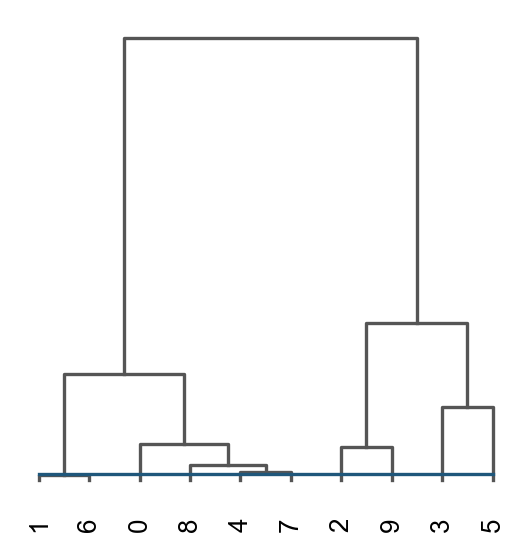

In [19]:
adata.obs['mclustpy_BINARY']=adata.obs['mclustpy_BINARY'].astype('category')
res=ov.space.merge_cluster(adata,groupby='mclustpy_BINARY',use_rep='BINARY',
                  threshold=0.013,plot=True)

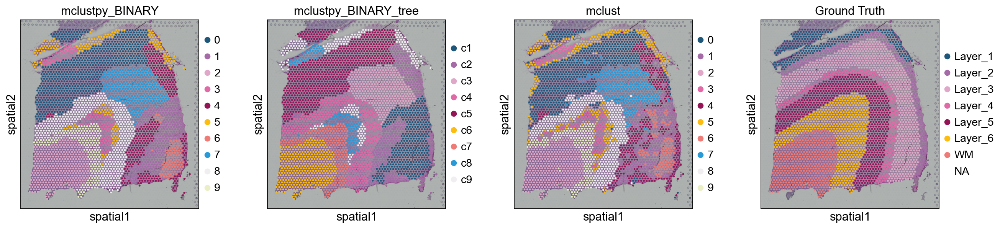

In [20]:
sc.pl.spatial(adata, color=['mclustpy_BINARY','mclustpy_BINARY_tree','mclust','Ground Truth'])
#adata.obs['mclust_BINARY'] = ov.utils.refine_label(adata, radius=30, key='mclust') 
#adata.obs['mclust_BINARY']=adata.obs['mclust_BINARY'].astype('category')

## Method3: STAGATE

STAGATE is designed for spatial clustering and denoising expressions of spatial resolved transcriptomics (ST) data.

STAGATE learns low-dimensional latent embeddings with both spatial information and gene expressions via a graph attention auto-encoder. The method adopts an attention mechanism in the middle layer of the encoder and decoder, which adaptively learns the edge weights of spatial neighbor networks, and further uses them to update the spot representation by collectively aggregating information from its neighbors. The latent embeddings and the reconstructed expression profiles can be used to downstream tasks such as spatial domain identification, visualization, spatial trajectory inference, data denoising and 3D expression domain extraction.

Dong, Kangning, and Shihua Zhang. “Deciphering spatial domains from spatially resolved transcriptomics with an adaptive graph attention auto-encoder.” Nature Communications 13.1 (2022): 1-12.


Here, we used `ov.space.pySTAGATE` to construct a STAGATE object to train the model. 


The STAGATE method is used to cluster the spatial data.


------Calculating spatial graph...
The graph contains 3060 edges, 559 cells.
5.4741 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 3328 edges, 595 cells.
5.5933 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 3448 edges, 613 cells.
5.6248 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 3044 edges, 541 cells.
5.6266 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 3128 edges, 559 cells.
5.5957 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 3320 edges, 595 cells.
5.5798 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 20052 edges, 3460 cells.
5.7954 neighbors per cell on average.


100%|██████████| 1000/1000 [01:28<00:00, 11.31it/s]


The STAGATE representation values are stored in adata.obsm["STAGATE"].
The rex values are stored in adata.layers["STAGATE_ReX"].
The STAGATE embedding are stored in adata.obsm["STAGATE"].
Shape: (3460, 30)


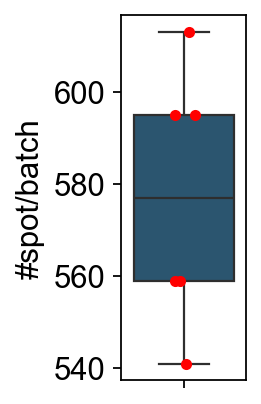

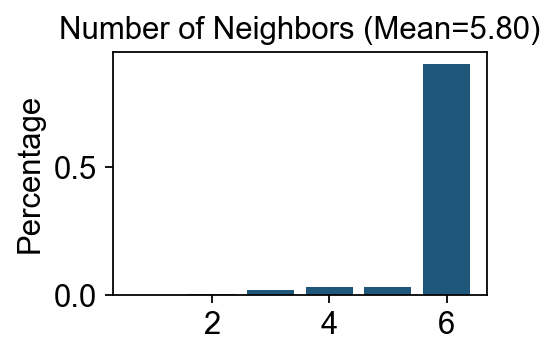

In [21]:
methods_kwargs={}
methods_kwargs['STAGATE']={
    'num_batch_x':3,'num_batch_y':2,
    'spatial_key':['X','Y'],'rad_cutoff':200,
    'num_epoch':1000,'lr':0.001,
    'weight_decay':1e-4,'hidden_dims':[512, 30],
    'device':'cuda:0',
    #'n_top_genes':2000,
}

adata=ov.space.clusters(adata,
                  methods=['STAGATE'],
                 methods_kwargs=methods_kwargs)

fitting ...
  |                                                                      |   0%

  |======================================================================| 100%
finished: found 10 clusters and added
    'mclust', the cluster labels (adata.obs, categorical)


100%|██████████| 3460/3460 [00:01<00:00, 3448.56it/s]

Storing dendrogram info using `.uns['dendrogram_mclust_R_STAGATE']`


The merged cluster information is stored in adata.obs["mclust_R_STAGATE_tree"].


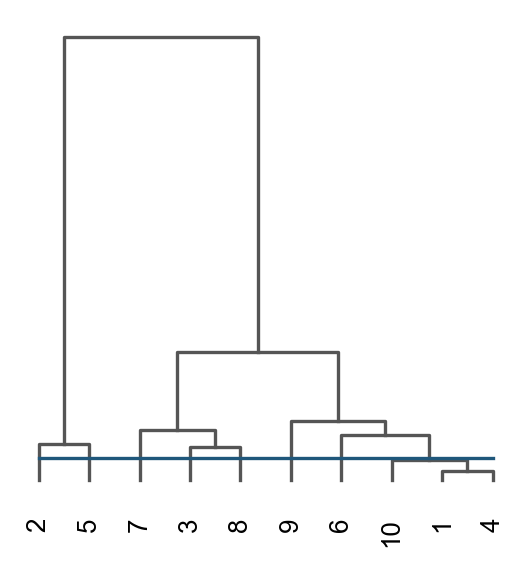

In [22]:
ov.utils.cluster(adata,use_rep='STAGATE',method='mclust_R',n_components=10,
                 random_state=112,
                )
adata.obs['mclust_R_STAGATE'] = ov.utils.refine_label(adata, radius=30, key='mclust_R') 
adata.obs['mclust_R_STAGATE']=adata.obs['mclust_R_STAGATE'].astype('category')
res=ov.space.merge_cluster(adata,groupby='mclust_R_STAGATE',use_rep='STAGATE',
                  threshold=0.005,plot=True)

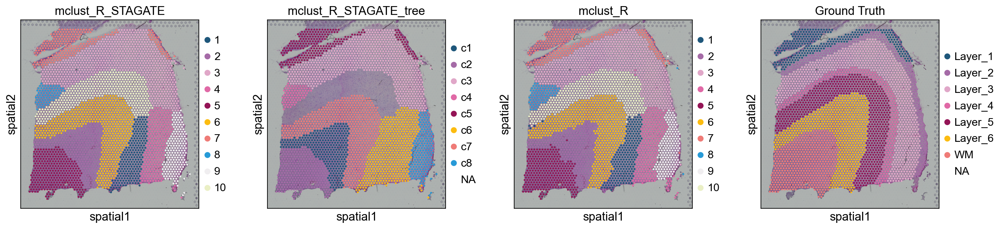

In [23]:
sc.pl.spatial(adata, color=['mclust_R_STAGATE','mclust_R_STAGATE_tree','mclust_R','Ground Truth'])

### Denoising

In [24]:
adata.var.sort_values('PI',ascending=False).head(5)

,gene_ids,feature_types,genome,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,n_cells,SEP,SIG,PI,space_variable_features,highly_variable
MBP,ENSG00000197971,Gene Expression,GRCh38,3411,15.419075,2.798444,1.416185,53350.0,10.884648,3411,0.823299,0.214148,1.000000,True,True
GFAP,ENSG00000131095,Gene Expression,GRCh38,2938,3.930347,1.595409,15.086705,13599.0,9.517825,2938,0.694169,0.129941,0.587889,True,True
PLP1,ENSG00000123560,Gene Expression,GRCh38,3214,9.255780,2.327841,7.109827,32025.0,10.374304,3214,0.668771,0.099919,0.478698,True,True
MT-ND1,ENSG00000198888,Gene Expression,GRCh38,3460,74.200578,4.320159,0.000000,256734.0,12.455800,3460,0.362000,0.163292,0.359299,True,True
MT-CO1,ENSG00000198804,Gene Expression,GRCh38,3460,115.025434,4.753809,0.000000,397988.0,12.894179,3460,0.472005,0.100106,0.338241,True,True


[<Axes: title={'center': 'STAGATE_MBP'}, xlabel='spatial1', ylabel='spatial2'>]

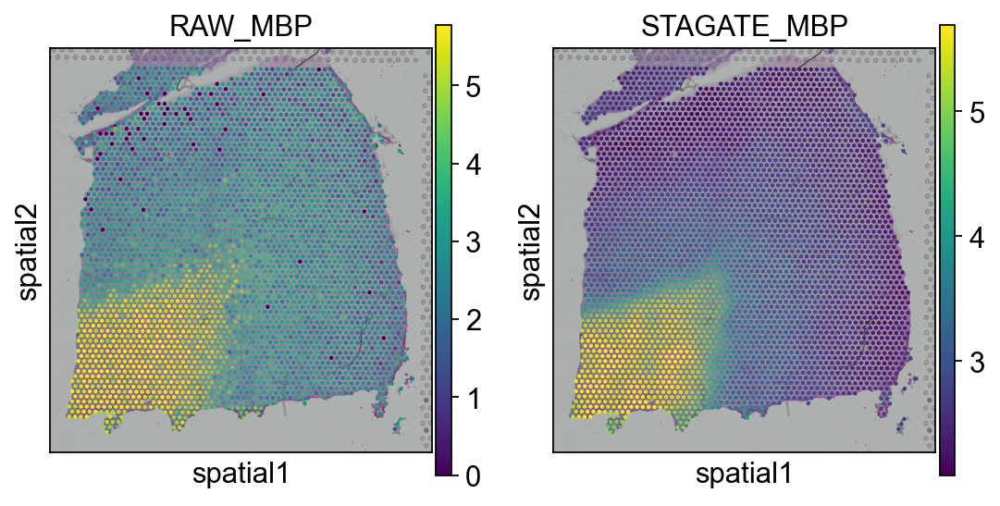

In [25]:
plot_gene = 'MBP'
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(8, 4))
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[0], title='RAW_'+plot_gene, vmax='p99')
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[1], title='STAGATE_'+plot_gene, layer='STAGATE_ReX', vmax='p99')


## Method4: CAST

CAST would be a great algorithm if your spatial transcriptome is at single-cell resolution and in multiple slices.

The CAST method is used to embed the spatial data.
normalizing counts per cell
    finished (0:00:00)
Constructing delaunay graphs for 1 samples...


Training on cuda:0...


Loss: -397.901 step time=0.089s: 100%|██████████| 400/400 [00:33<00:00, 11.90it/s]


Finished.
The embedding, log, model files were saved to result/CAST_gas/output


100%|██████████| 1/1 [00:00<00:00, 21.74it/s]


The CAST embedding are stored in adata.obsm["X_cast"]. 
Shape: (3460, 512)


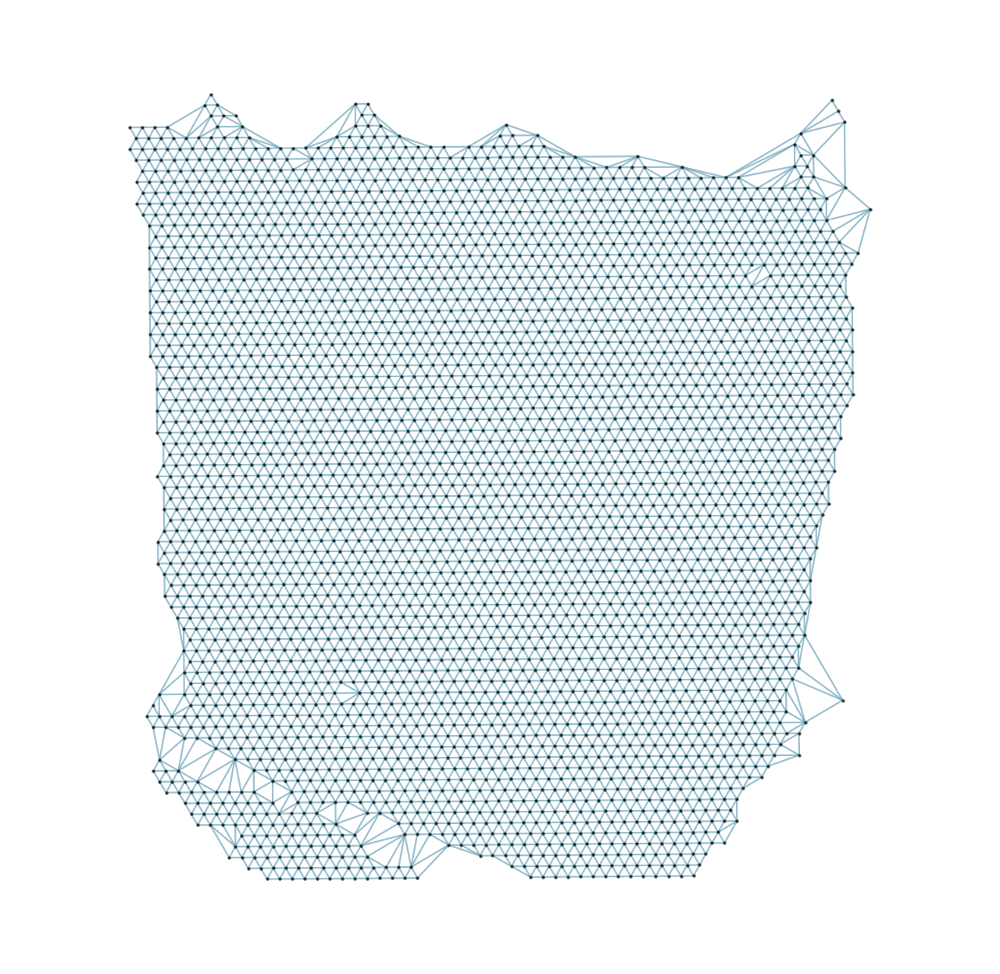

In [26]:
methods_kwargs={}
methods_kwargs['CAST']={
    'output_path_t':'result/CAST_gas/output',
    'device':'cuda:0',
    'gpu_t':0
}
adata=ov.space.clusters(adata,
                  methods=['CAST'],
                 methods_kwargs=methods_kwargs)

In [27]:
ov.utils.cluster(adata,use_rep='X_cast',method='mclust',n_components=10,
                 modelNames='EEV', random_state=42,
                )
adata.obs['mclust_CAST'] = ov.utils.refine_label(adata, radius=50, key='mclust') 
adata.obs['mclust_CAST']=adata.obs['mclust_CAST'].astype('category')

running GaussianMixture clustering


finished: found 10 clusters and added
    'mclust', the cluster labels (adata.obs, categorical)


100%|██████████| 3460/3460 [00:01<00:00, 3049.62it/s]


Storing dendrogram info using `.uns['dendrogram_mclust_CAST']`
The merged cluster information is stored in adata.obs["mclust_CAST_tree"].


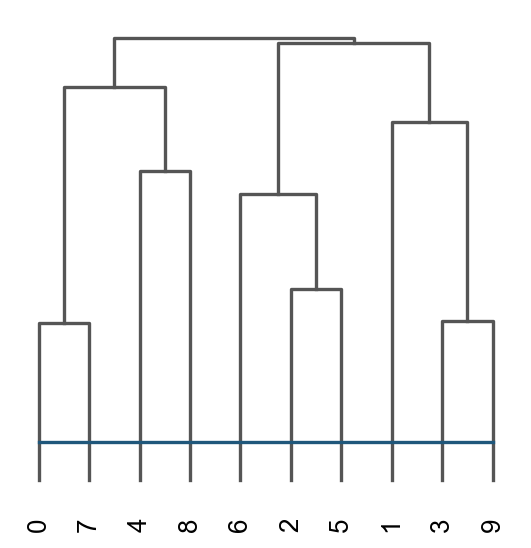

In [28]:
res=ov.space.merge_cluster(adata,groupby='mclust_CAST',use_rep='X_cast',
                  threshold=0.1,plot=True)

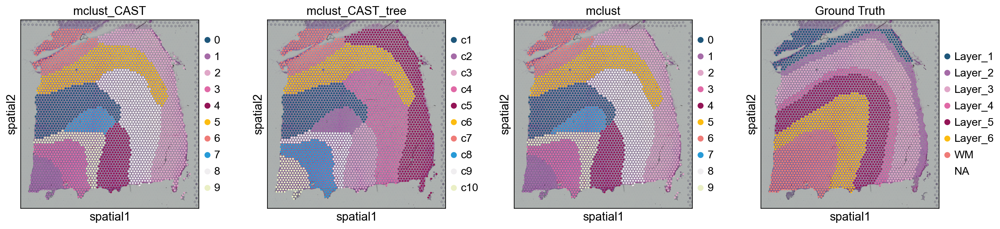

In [29]:
sc.pl.spatial(adata, color=['mclust_CAST','mclust_CAST_tree','mclust','Ground Truth'])

In [30]:
adata

AnnData object with n_obs × n_vars = 3460 × 5779
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'image_idx_1d', 'Ground Truth', 'mclust', 'gmm_cluster', 'mclust_GraphST', 'mclust_GraphST_tree', 'mclust_R', 'mclust_R_GraphST', 'mclust_R_GraphST_tree', 'BINARY_sample', 'mclust_BINARY', 'mclust_BINARY_tree', 'mclustpy_BINARY', 'mclustpy_BINARY_tree', 'mclust_R_STAGATE', 'mclust_R_STAGATE_tree', 'X', 'Y', 'CAST_sample', 'mclust_CAST', 'mclust_CAST_tree'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'SEP', 'SIG', 'PI', 'space_variable_features', 'highly_variable'
    uns: 'REFERENCE_MANU', 'binary_image', 'del_index', 'gau_fea', 'grid_size', 'locates', '

## Evaluate cluster

We use ARI to evaluate the scoring of our clusters against the true values

While it appears that STAGATE works best, note that this is only on this dataset.
- If your data is spot-level resolution, GraphST, BINARY and STAGATE would be good algorithms to use
- BINARY and CAST would be good algorithms if your data is NanoString or other single-cell resolution

In [31]:
from sklearn.metrics.cluster import adjusted_rand_score

obs_df = adata.obs.dropna()
#GraphST
ARI = adjusted_rand_score(obs_df['mclust_GraphST'], obs_df['Ground Truth'])
print('mclust_GraphST: Adjusted rand index = %.2f' %ARI)

ARI = adjusted_rand_score(obs_df['mclust_R_GraphST'], obs_df['Ground Truth'])
print('mclust_R_GraphST: Adjusted rand index = %.2f' %ARI)

ARI = adjusted_rand_score(obs_df['mclust_R_STAGATE'], obs_df['Ground Truth'])
print('mclust_STAGATE: Adjusted rand index = %.2f' %ARI)

ARI = adjusted_rand_score(obs_df['mclust_BINARY'], obs_df['Ground Truth'])
print('mclust_BINARY: Adjusted rand index = %.2f' %ARI)

ARI = adjusted_rand_score(obs_df['mclustpy_BINARY'], obs_df['Ground Truth'])
print('mclustpy_BINARY: Adjusted rand index = %.2f' %ARI)

ARI = adjusted_rand_score(obs_df['mclust_CAST'], obs_df['Ground Truth'])
print('mclust_CAST: Adjusted rand index = %.2f' %ARI)


mclust_GraphST: Adjusted rand index = 0.41
mclust_R_GraphST: Adjusted rand index = 0.45
mclust_STAGATE: Adjusted rand index = 0.43
mclust_BINARY: Adjusted rand index = 0.34
mclustpy_BINARY: Adjusted rand index = 0.34
mclust_CAST: Adjusted rand index = 0.39
